# Загрузка изображений и их масок

In [1]:
using_colab = True

In [2]:
! pip install wldhx.yadisk-direct

In [3]:
!curl -L $(yadisk-direct https://disk.yandex.com/d/jJrOLbYlBYVESQ) -o lyft_segmentation.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
100 2620M  100 2620M    0     0  13.9M      0  0:03:08  0:03:08 --:--:-- 14.4M


In [4]:
! unzip -qq lyft_segmentation.zip

In [5]:
!ls /content/lyft_segmentation/segmentation_masks | wc -l

5000


In [13]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import torch

In [15]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [16]:
!nvidia-smi

Thu Nov 14 09:11:57 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P8               9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [7]:
DATA_ROOT = '/kaggle/input/lyft-udacity-challenge/'

2

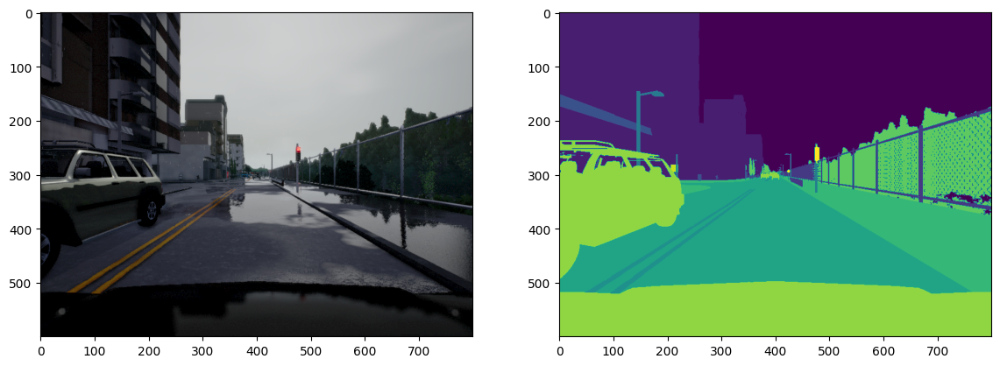

In [8]:
img = plt.imread('./lyft_segmentation/images/02_00_000.png')
img_seg = plt.imread('./lyft_segmentation/segmentation_masks/02_00_000.png')

_, axes = plt.subplots(1,2, figsize=(14,10))
axes[0].imshow(img);
axes[1].imshow(img_seg[..., 0]);2

In [9]:
len(img_seg * 255)

600

In [10]:
labels = {
    0: 'Unlabeled',
    1: 'Building',
    2: 'Fence',
    3: 'Other',
    4: 'Pedestrian',
    5: 'Pole',
    6: 'Roadline',
    7: 'Road',
    8: 'Sidewalk',
    9: 'Vegetation',
    10: 'Car',
    11: 'Wall',
    12: 'Traffic sign'
}

[  0 255]


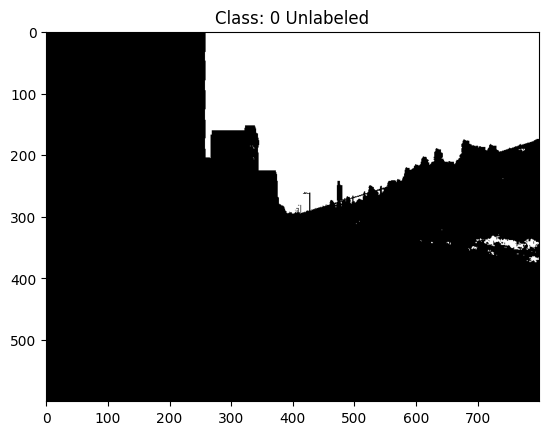

[  0 255]


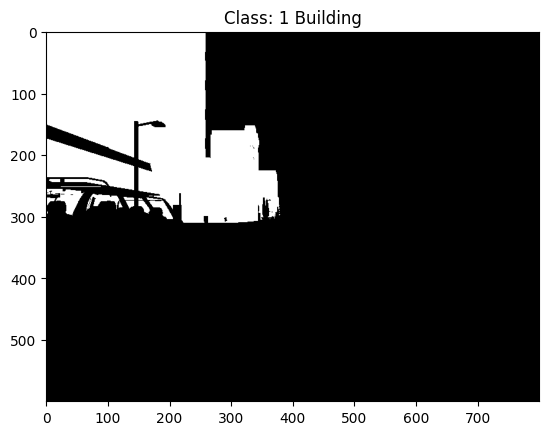

[  0 255]


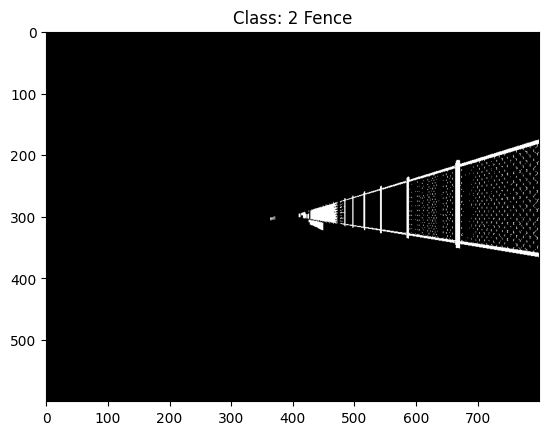

[  0 255]


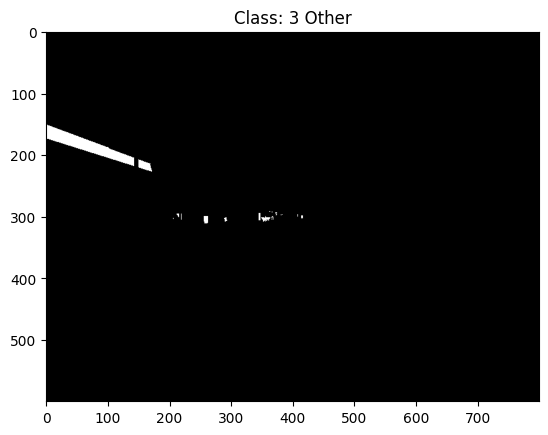

[0]


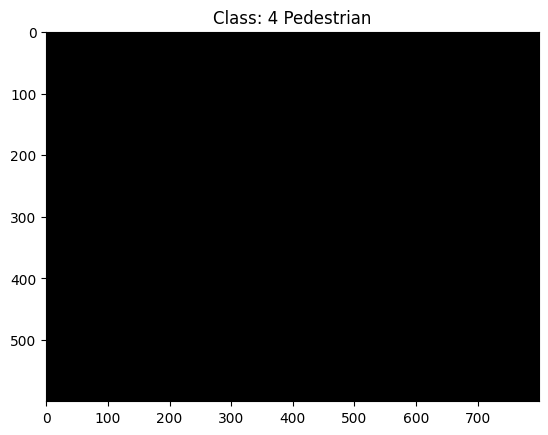

[  0 255]


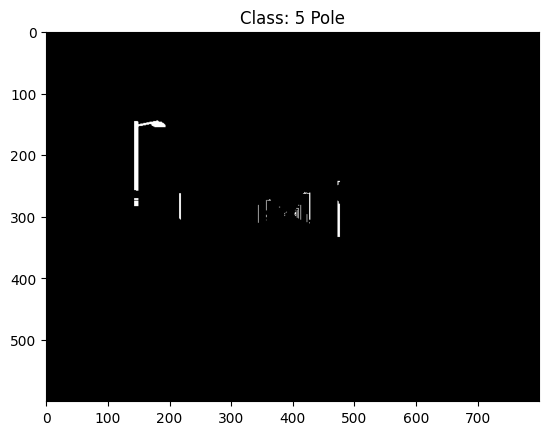

[  0 255]


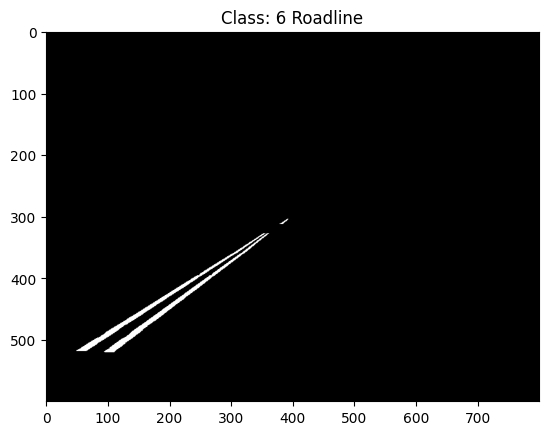

[  0 255]


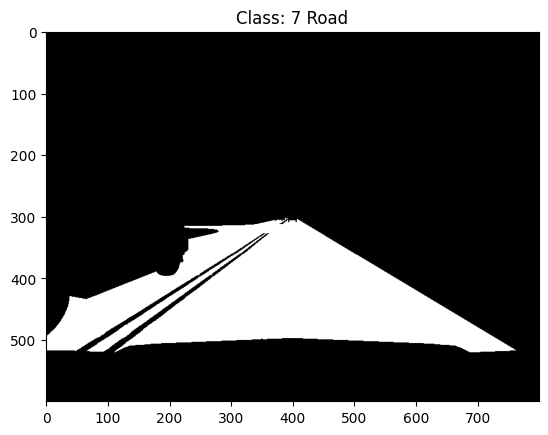

[  0 255]


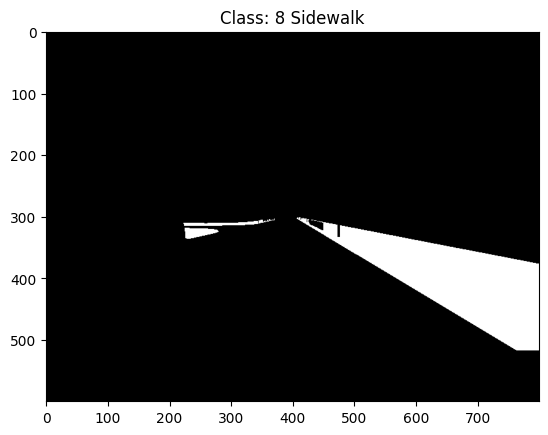

[  0 255]


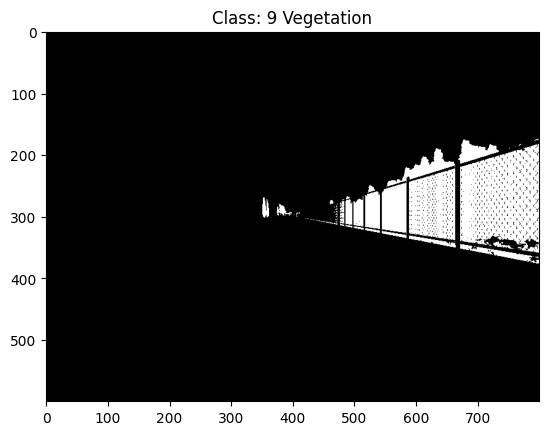

[  0 255]


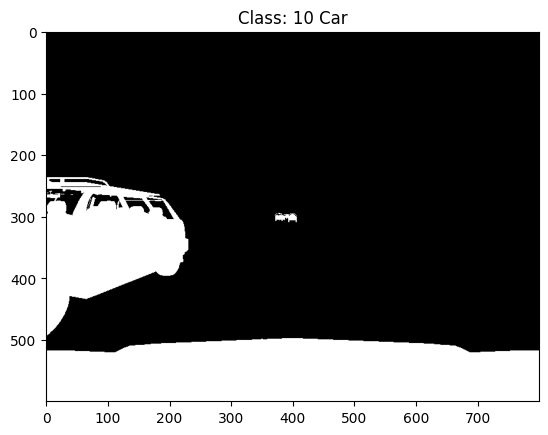

[  0 255]


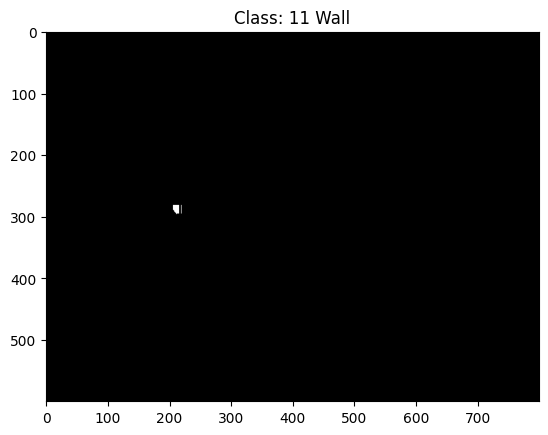

[  0 255]


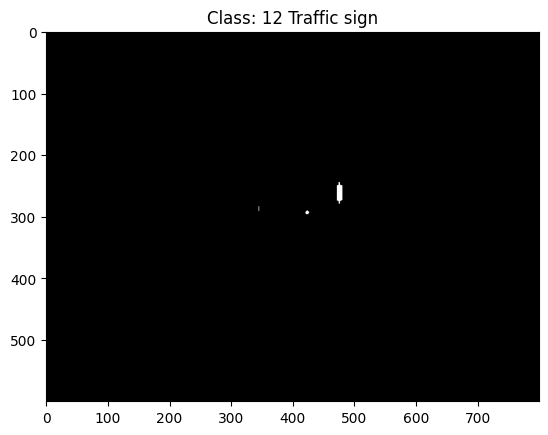

In [12]:
img = '02_00_000'

for i in range(13):
    mask = plt.imread(f'./lyft_segmentation/segmentation_masks/{img}.png') * 255
    mask = np.where(mask == i, 255, 0)
    mask = mask[:, :, 0]
    print(np.unique(mask))
    plt.title(f'Class: {i} {labels[i]}')
    plt.imshow(mask, cmap='gray')
    plt.show()


In [ ]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'


    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

PyTorch version: 2.5.0+cu121
Torchvision version: 0.20.0+cu121
CUDA is available: True
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-6cusi__o
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-6cusi__o
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=5119cdca48f3cb30f12b13e19638af1db1e8b766ef74ccbfd9201cd2b2c61994
  Stored in directory: /tmp/pip-ephem-wheel-cache-_m8dtf4m/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment_anything
--2024-11-13 11:16:53--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.227.219.59, 13.227.219.33, 

In [ ]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))


In [ ]:
image = cv2.imread('./lyft_segmentation/images/02_00_000.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

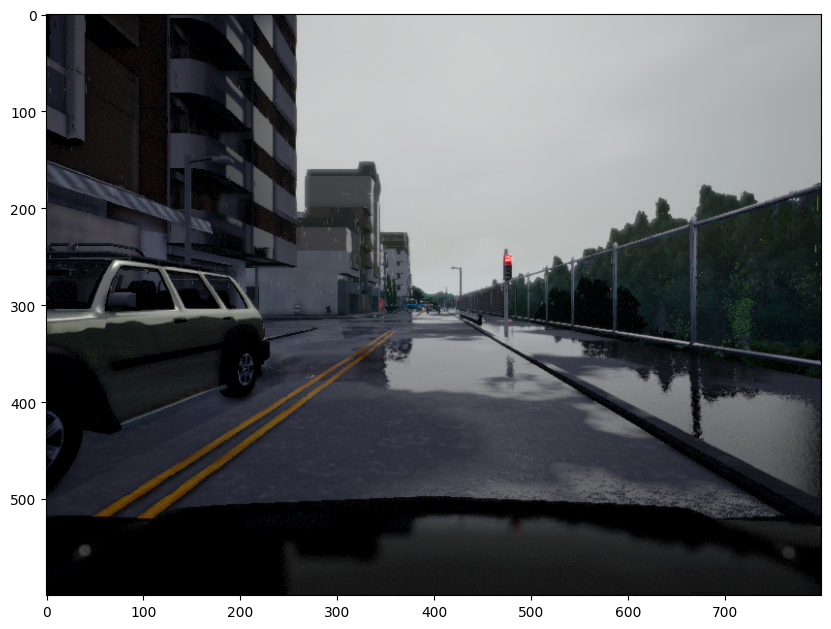

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('on')
plt.show()

## Сначала пробую использовать SamAutomaticMaskGenerator для генерации масок сегментации

In [ ]:
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry
sam = sam_model_registry["vit_h"](checkpoint="sam_vit_h_4b8939.pth")
mask_generator = SamAutomaticMaskGenerator(sam)
masks = mask_generator.generate(image)

/usr/local/lib/python3.10/dist-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


In [ ]:
len(masks)

80

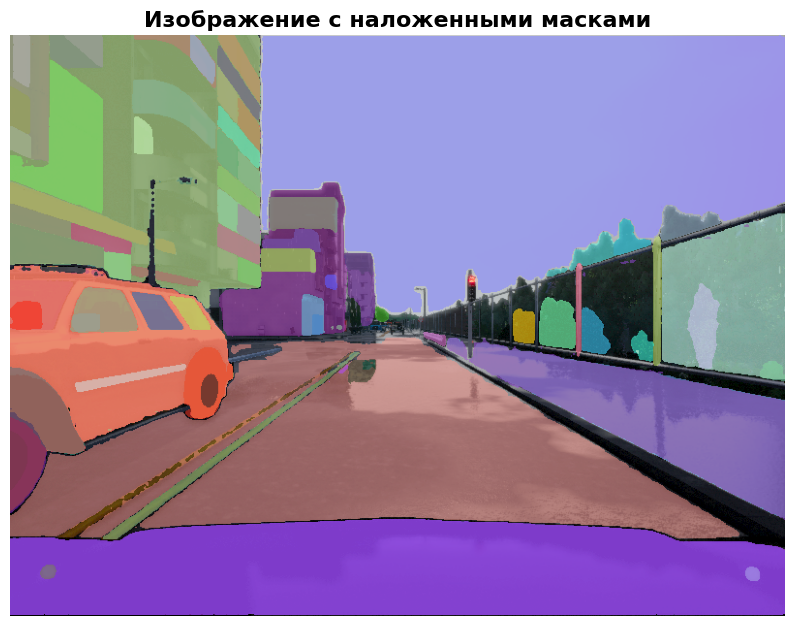

In [ ]:
output_image = image.copy()

for mask in masks:
    mask_array = mask['segmentation']
    color = np.random.randint(0, 255, size=(3,), dtype=np.uint8)
    output_image[mask_array] = (output_image[mask_array] * 0.5 + color * 0.5).astype(np.uint8)

plt.figure(figsize=(10, 10))
plt.imshow(output_image)
plt.axis('off')
plt.title('Изображение с наложенными масками', fontsize=16, fontweight='bold')
plt.show()


### Sam сгенерировал 80 масок сегментации, что является слишком большим количеством для нас. Мы не можем посчитать метрики и адекватно оценить результат модели, тк сегментируется буквально любая деталь

# Sam с промптами
У sam есть промты (координаты точки или баундинг боксы) при помощи которых можно примерно понять как модель будет сегментировать те или иные классы, воспользуемся этими промптами и посчитаем метрики для нескольких классов


In [ ]:
import sys
sys.path.append("..")

from segment_anything import sam_model_registry, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"
device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
# sam.to(device=device)

predictor = SamPredictor(sam)


/usr/local/lib/python3.10/dist-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


In [ ]:
predictor.set_image(image)

In [ ]:
input_point = np.array([[150, 150], [325, 250]])
input_label = np.array([1,1])


In [ ]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

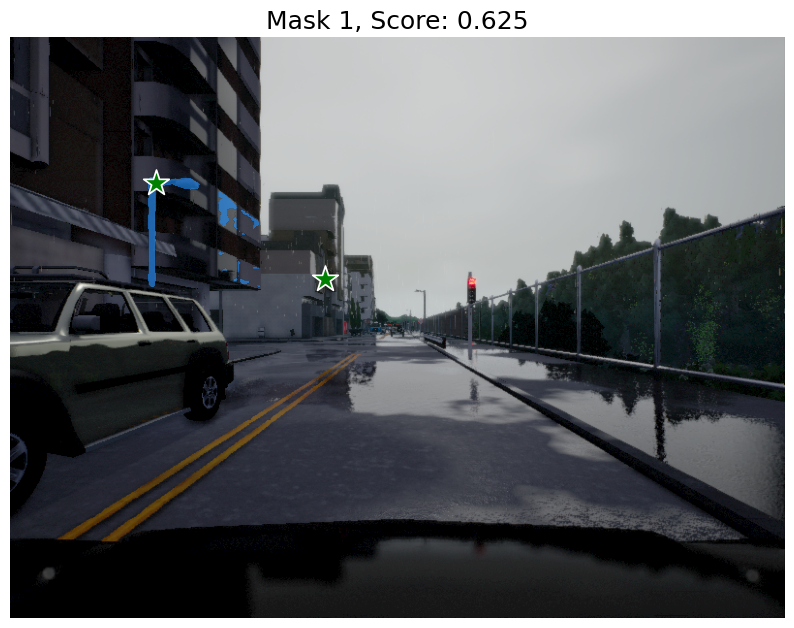

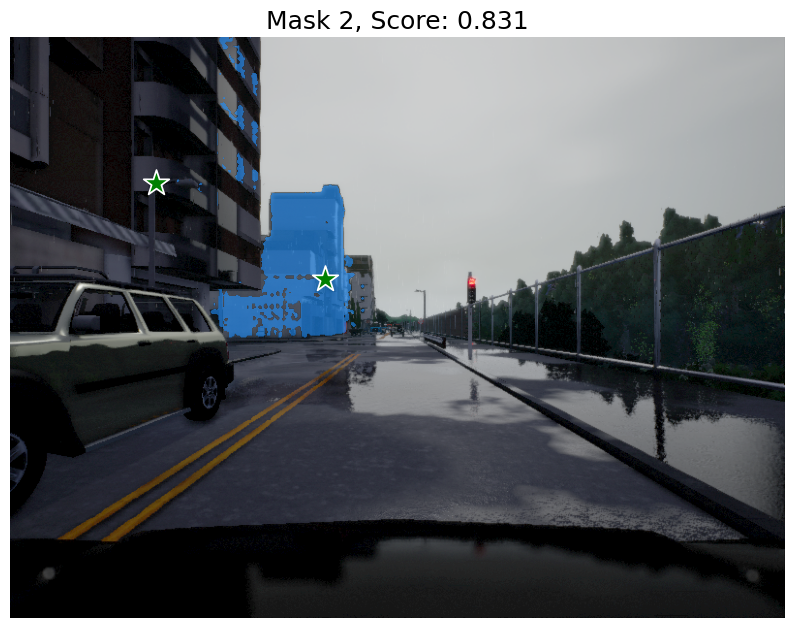

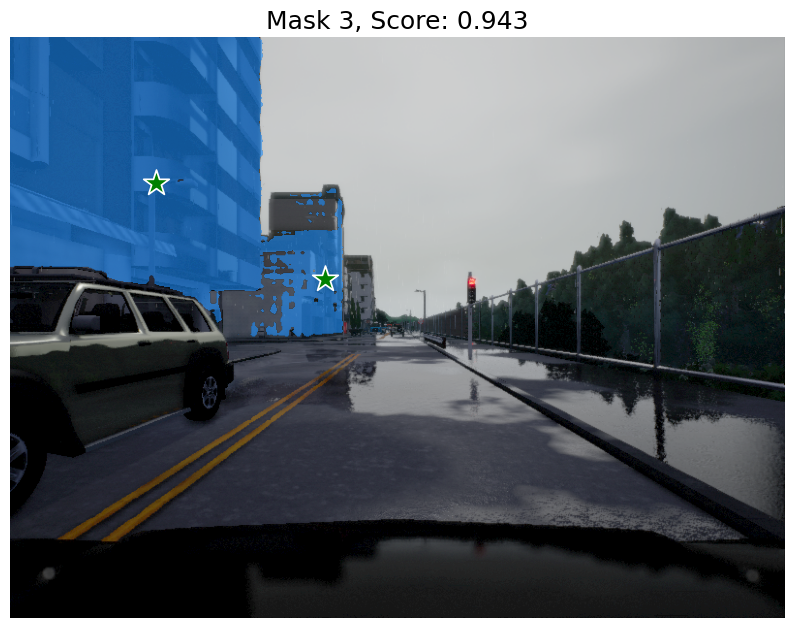

In [ ]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

# Создаем список предсказанных масок, которые используются для оценки качества предсказания

In [ ]:
import numpy as np

coordinates = [
    [[550, 100]],  # unlabeled
    [[150, 150], [325, 250]],  # buildings
    [[400, 400]],  # road
    [[150, 350], [400, 550], [400, 300]]  # car
]

pred_masks_used = []
for i in range(len(coordinates)):
    point_coords = np.array(coordinates[i])
    input_label = np.array([1] * len(point_coords))

    masks, scores, logits = predictor.predict(
        point_coords=point_coords,
        point_labels=input_label,
        multimask_output=True,
    )

    max_score_index = np.argmax(scores)
    pred_masks_used.append(masks[max_score_index])


[  0 255]


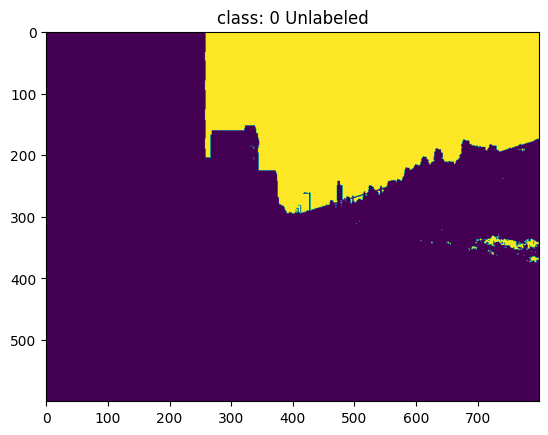

[  0 255]


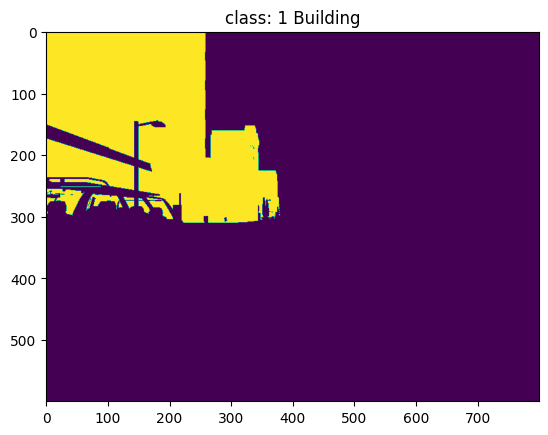

[  0 255]


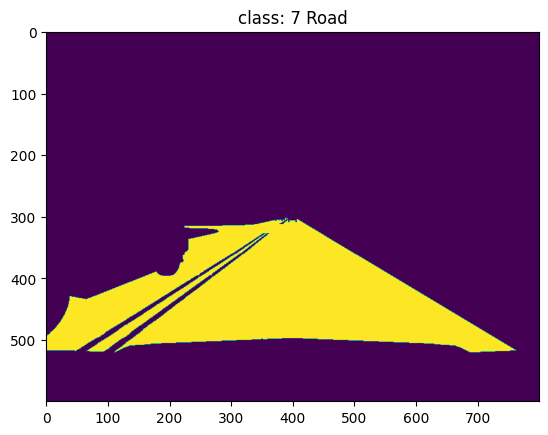

[  0 255]


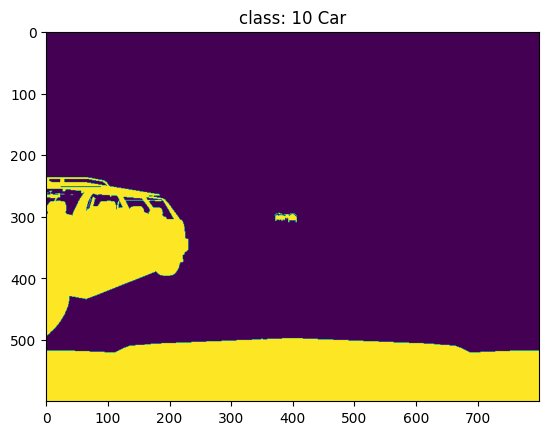

In [ ]:
img = '02_00_000'
masks_used = []
labels_used = [0, 1, 7, 10]

for i in labels_used:
    mask = plt.imread(f'./lyft_segmentation/segmentation_masks/{img}.png') * 255
    mask = np.where(mask == i, 255, 0)
    mask = mask[:, :, 0]
    print(np.unique(mask))
    plt.title(f'Class: {i} {labels[i]}')
    plt.imshow(mask, cmap='gray')
    plt.show()
    masks_used.append(mask)

In [ ]:
import torch
import numpy as np

iou_used = []
precision_used = []
recall_used = []
f1_score_used = []

print(f"{'Class':<20} {'IoU':<10} {'Precision':<10} {'Recall':<10} {'F1 Score':<10}")

for i in range(len(masks_used)):
    mask = masks_used[i]
    pred_mask = pred_masks_used[i]

    gt_mask_np = np.array(mask)
    gt_mask_binary = (gt_mask_np > 0).astype(np.uint8)

    gt_mask_tensor = torch.tensor(gt_mask_binary)
    pred_mask_tensor = torch.tensor(pred_mask, dtype=torch.uint8)

    intersection = (pred_mask_tensor & gt_mask_tensor).sum()
    union = (pred_mask_tensor | gt_mask_tensor).sum()
    iou = intersection / union if union > 0 else torch.tensor(0.0)
    iou_used.append(iou.item())

    TP = (pred_mask_tensor & gt_mask_tensor).sum().item()
    FP = (pred_mask_tensor & ~gt_mask_tensor).sum().item()
    FN = (~pred_mask_tensor & gt_mask_tensor).sum().item()

    precision = TP / (TP + FP) if (TP + FP) > 0 else 0.0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0.0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0.0

    precision_used.append(precision)
    recall_used.append(recall)
    f1_score_used.append(f1)

    print(f"{labels[labels_used[i]]:<20} {iou.item():<10.4f} {precision:<10.4f} {recall:<10.4f} {f1:<10.4f}")

print("\nSummary:")
print(f"Average IoU: {np.mean(iou_used):.4f}")
print(f"Average Precision: {np.mean(precision_used):.4f}")
print(f"Average Recall: {np.mean(recall_used):.4f}")
print(f"Average F1 Score: {np.mean(f1_score_used):.4f}")


Class                IoU        Precision  Recall     F1 Score  
Unlabeled            0.9464     1.0000     0.9464     0.9724    
Building             0.7280     0.9463     0.7594     0.8426    
Road                 0.9259     0.9957     0.9297     0.9615    
Car                  0.5210     0.5355     0.9505     0.6851    

Summary:
Average IoU: 0.7803
Average Precision: 0.8694
Average Recall: 0.8965
Average F1 Score: 0.8654


--------------------------------------------------------------------
# YOLO v8

--------------------------------------------------------------------

In [ ]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 39.9/112.6 GB disk)


Предобученная yolov8 максимального размера

In [ ]:
import cv2
import numpy as np
from ultralytics import YOLO
import matplotlib.pyplot as plt


model = YOLO('yolov8x-seg.pt')


image_path = '/content/lyft_segmentation/images/02_00_000.png'

image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
h_or, w_or = image.shape[:2]

image_resized = cv2.resize(image, (640, 640))

results = model(image_resized)


100%|██████████| 137M/137M [00:03<00:00, 45.8MB/s]



0: 640x640 1 car, 1 truck, 1 traffic light, 85.0ms
Speed: 6.6ms preprocess, 85.0ms inference, 967.4ms postprocess per image at shape (1, 3, 640, 640)


[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chai

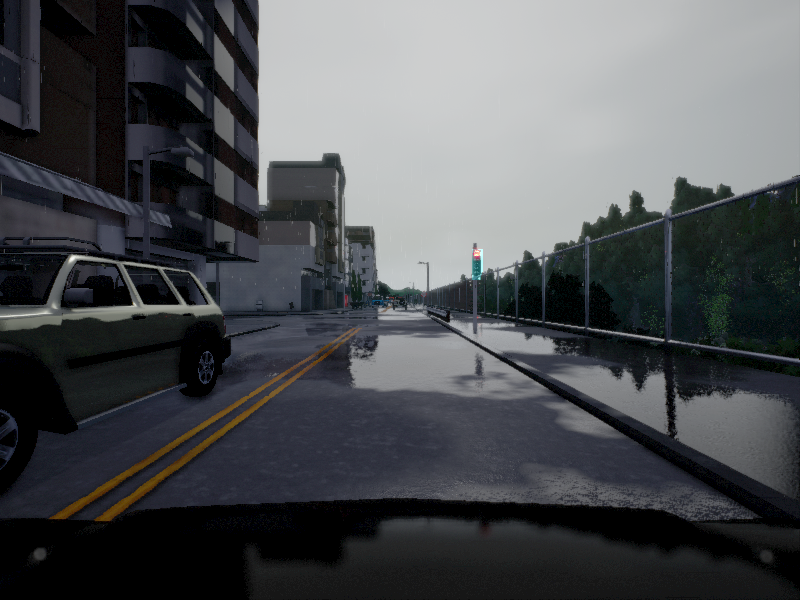

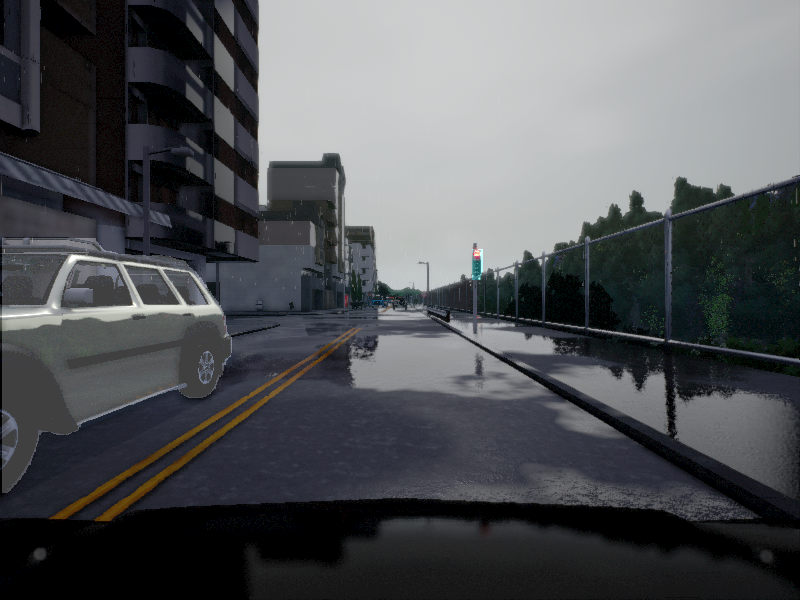

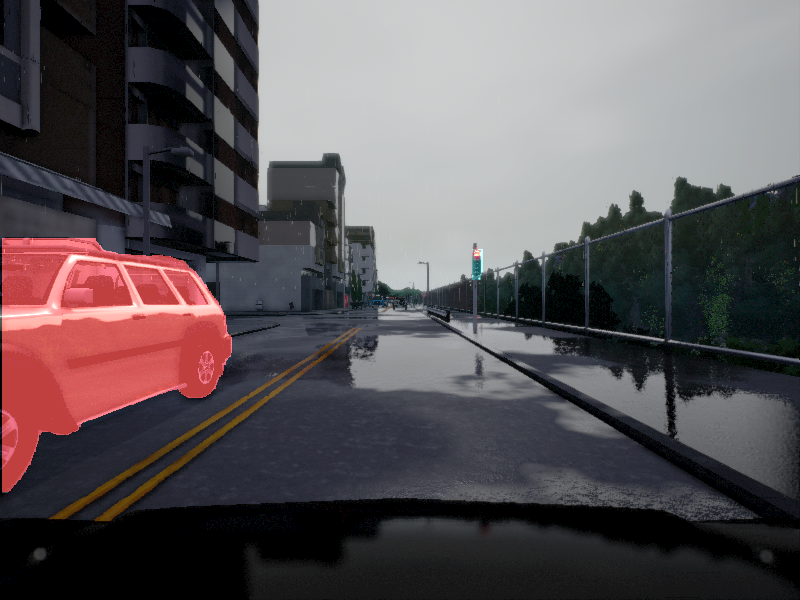

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
colors = [
    (255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (0, 255, 255),
    (255, 0, 255), (192, 192, 192), (128, 128, 128), (128, 0, 0), (128, 128, 0),
    (0, 128, 0), (128, 0, 128), (0, 128, 128), (0, 0, 128), (72, 61, 139),
    (47, 79, 79), (47, 79, 47), (0, 206, 209), (148, 0, 211), (255, 20, 147)
]
print(results)

results = model(image)
for result in results:
    masks = result.masks.data
    classes = result.boxes.cls
    scores = result.boxes.conf

print(f' {classes}, classes\n {scores}scores')
results = model(image_resized)[0]
classes_names = results.names
classes = results.boxes.cls.cpu().numpy()
masks = results.masks.data.cpu().numpy()


for i, mask in enumerate(masks):
    color = colors[int(classes[i]) % len(colors)]


    mask_resized = cv2.resize(mask, (w_or, h_or))
    color_mask = np.zeros((h_or, w_or, 3), dtype=np.uint8)
    color_mask[mask_resized > 0] = color


    image = cv2.addWeighted(image, 1.0, color_mask, 0.5, 0)


    cv2_imshow(image)

[  0 255]


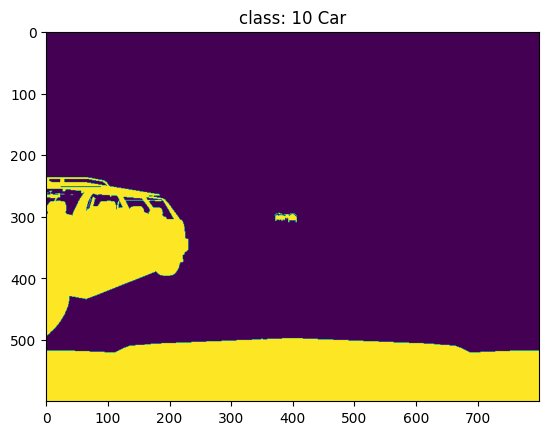

[  0 255]


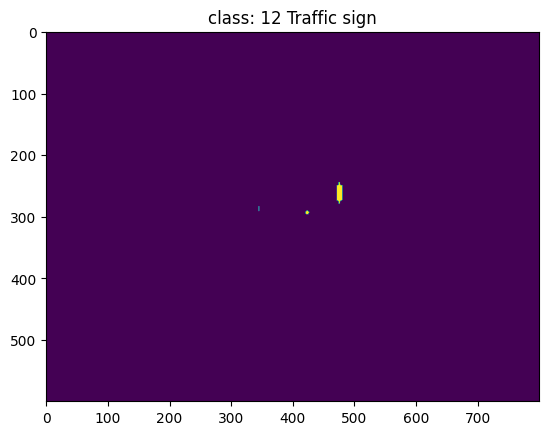

In [ ]:
img = '02_00_000'

masks_used = []
labels_used = [10, 12]
for i in labels_used:
    mask = plt.imread('./lyft_segmentation/segmentation_masks/{}.png'.format(img)) * 255
    mask = np.where(mask == i, 255, 0)
    mask = mask[:,:,0]
    print(np.unique(mask))
    plt.title(f'class: {i} {labels[i]}')
    plt.imshow(mask)
    plt.show()
    masks_used.append(mask)


In [ ]:
import torch
import numpy as np

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


mask = masks_used[0]
pred_mask = masks[2]
gt_mask_np = np.array(mask)


gt_mask_binary = (gt_mask_np > 0).astype(np.uint8)
gt_mask_tensor = torch.tensor(gt_mask_binary).unsqueeze(0).unsqueeze(0).to(device)
pred_mask_tensor = torch.tensor(pred_mask, dtype=torch.uint8).unsqueeze(0).unsqueeze(0).to(device)


if gt_mask_tensor.shape != pred_mask_tensor.shape:
    pred_mask_tensor = torch.nn.functional.interpolate(
        pred_mask_tensor.float(),
        size=gt_mask_tensor.shape[2:],
        mode='nearest'
    ).byte()


gt_mask_tensor = gt_mask_tensor.squeeze(0).squeeze(0)
pred_mask_tensor = pred_mask_tensor.squeeze(0).squeeze(0)

intersection = (pred_mask_tensor & gt_mask_tensor).sum()  # Пересечение
union = (pred_mask_tensor | gt_mask_tensor).sum()  # Объединение


true_positives = ((pred_mask_tensor == 1) & (gt_mask_tensor == 1)).sum()
false_negatives = ((pred_mask_tensor == 0) & (gt_mask_tensor == 1)).sum()


recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else torch.tensor(0.0)
print(f'Recall: {recall.item():.4f}')


iou = intersection / union if union > 0 else torch.tensor(0.0)
print(f'IOU {labels[labels_used[0]]}: {iou.item():.4f}')


Recall: 0.3053
IOU Car: 0.2946


In [ ]:
import torch
import numpy as np

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


mask = masks_used[1]
pred_mask = masks[0]
gt_mask_np = np.array(mask)


gt_mask_binary = (gt_mask_np > 0).astype(np.uint8)
gt_mask_tensor = torch.tensor(gt_mask_binary).unsqueeze(0).unsqueeze(0).to(device)
pred_mask_tensor = torch.tensor(pred_mask, dtype=torch.uint8).unsqueeze(0).unsqueeze(0).to(device)


if gt_mask_tensor.shape != pred_mask_tensor.shape:
    pred_mask_tensor = torch.nn.functional.interpolate(
        pred_mask_tensor.float(),
        size=gt_mask_tensor.shape[2:],
        mode='nearest'
    ).byte()


gt_mask_tensor = gt_mask_tensor.squeeze(0).squeeze(0)
pred_mask_tensor = pred_mask_tensor.squeeze(0).squeeze(0)


intersection = (pred_mask_tensor & gt_mask_tensor).sum()
union = (pred_mask_tensor | gt_mask_tensor).sum()



true_positives = ((pred_mask_tensor == 1) & (gt_mask_tensor == 1)).sum()
false_negatives = ((pred_mask_tensor == 0) & (gt_mask_tensor == 1)).sum()


recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else torch.tensor(0.0)
print(f'Recall: {recall.item():.4f}')


iou = intersection / union if union > 0 else torch.tensor(0.0)
print(f'IOU {labels[labels_used[1]]}: {iou.item():.4f}')


Recall: 0.7430
IOU Traffic sign: 0.5944


# Fine-tuning Yolo

In [ ]:
# Установка необходимых библиотек
!pip install ultralytics
!pip install pillow numpy pycocotools opencv-python


Создаем аннотации для дообучения yolo (используем только один класс roadline, потому что иначе аннотации получаются очень большими и модель не успевает хоть немного дообучиться(используются координаты всех пикселей нужного класса))

In [ ]:
import os
import numpy as np
import glob
from tqdm import tqdm
import matplotlib.pyplot as plt

segmentation_masks_dir = './lyft_segmentation/segmentation_masks/'
labels_dir = './lyft_segmentation/labels/'

os.makedirs(labels_dir, exist_ok=True)
mask_paths = glob.glob(os.path.join(segmentation_masks_dir, '*.png'))

for mask_path in tqdm(mask_paths, desc="Обработка масок", unit="маска"):
    img_seg = plt.imread(mask_path)[:, :, 0]
    img_seg = (img_seg * 255).astype(np.uint8)

    annotations = []
    img_height, img_width = 600, 800
    class_id = 6
    mask = np.where(img_seg == class_id, 1, 0).astype(np.uint8)
    coordinates = np.argwhere(mask == 1)

    if coordinates.size > 0:
        xy_coordinates = [(x, y) for y, x in coordinates]
        annotation_line = f"0 " + " ".join([f"{x / img_width:.6f} {y / img_height:.6f}" for x, y in xy_coordinates])
        annotations.append(annotation_line)

    if annotations:
        output_filename = os.path.basename(mask_path).replace('.png', '.txt')
        output_path = os.path.join(labels_dir, output_filename)

        with open(output_path, 'w') as f:
            f.write('\n'.join(annotations))

print("Обработка всех масок завершена.")


Создаем нужную для yolo структуру папок, а также делим на валидационную и тренировочную выборки

In [ ]:
import os
import shutil
import numpy as np

images_dir = '/content/lyft_segmentation/images'
labels_dir = '/content/lyft_segmentation/labels'
train_images_dir = './lyft_segmentation/train/images'
train_labels_dir = './lyft_segmentation/train/labels'
val_images_dir = './lyft_segmentation/val/images'
val_labels_dir = './lyft_segmentation/val/labels'

for directory in [train_images_dir, train_labels_dir, val_images_dir, val_labels_dir]:
    os.makedirs(directory, exist_ok=True)

image_files = [f for f in os.listdir(images_dir) if f.endswith('.png')]

val_size = int(0.2 * len(image_files))
val_files = np.random.choice(image_files, size=val_size, replace=False)

train_files = [f for f in image_files if f not in val_files]


def copy_files(files, image_dir, label_dir, target_image_dir, target_label_dir):
    for file in files:
        label_file = file.replace('.png', '.txt')
        label_path = os.path.join(label_dir, label_file)

        if os.path.exists(label_path):
            shutil.copy(os.path.join(image_dir, file), os.path.join(target_image_dir, file))
            shutil.copy(label_path, os.path.join(target_label_dir, label_file))
        else:
            print(f"Аннотация для {file} не найдена, файл пропущен.")


copy_files(val_files, images_dir, labels_dir, val_images_dir, val_labels_dir)
copy_files(train_files, images_dir, labels_dir, train_images_dir, train_labels_dir)

print("Данные успешно разделены на тренировочную и валидационную выборки!")


Создаем .yaml файл для нашей модели

In [ ]:
yaml_content = """
# Ultralytics YOLO 🚀, AGPL-3.0 license
# Lyft Segmentation dataset
# Documentation: https://docs.ultralytics.com/datasets/segment/
# Example usage: yolo train data=lyft_dataset.yaml

# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: ../lyft_segmentation  # dataset root dir
train: train/images         # train images (relative to 'path')
val: val/images             # val images (relative to 'path')
test:                       # test images (optional)

# Classes
nc: 13
names:
  0: 'Unlabeled'
  1: 'Building'
  2: 'Fence'
  3: 'Other'
  4: 'Pedestrian'
  5: 'Pole'
  6: 'Roadline'
  7: 'Road'
  8: 'Sidewalk'
  9: 'Vegetation'
  10: 'Car'
  11: 'Wall'
  12: 'Traffic sign'
"""

with open("/content/lyft_segmentation/lyft_dataset.yaml", "w", encoding="utf-8") as f:
    f.write(yaml_content)


Выбираем подходящую модельку

In [ ]:
from ultralytics import YOLO
model = YOLO('yolo8m-seg.pt')

Освобождаем место (данные из labels скопированы и разделены в train и val)

In [ ]:
!rm -rf lyft_segmentation/labels

При необходимости сокращаем количество изображений

In [ ]:
import os
import random
from tqdm import tqdm

train_images_dir = '/content/lyft_segmentation/train/images'
train_labels_dir = '/content/lyft_segmentation/train/labels'
val_images_dir = '/content/lyft_segmentation/val/images'
val_labels_dir = '/content/lyft_segmentation/val/labels'

def delete_percent_of_pairs(images_dir, labels_dir, percent=20):
    """Удаляет случайный процент (по умолчанию 20%) пар файлов изображения и аннотации."""
    image_files = {os.path.splitext(f)[0] for f in os.listdir(images_dir)}
    label_files = {os.path.splitext(f)[0] for f in os.listdir(labels_dir)}
    common_files = list(image_files.intersection(label_files))

    files_to_delete = random.sample(common_files, len(common_files) * percent // 100)

    for file_name in tqdm(files_to_delete, desc=f"Удаление пар из {images_dir} и {labels_dir}"):
        image_path = os.path.join(images_dir, file_name + '.png')
        label_path = os.path.join(labels_dir, file_name + '.txt')

        if os.path.isfile(image_path) and os.path.isfile(label_path):
            os.remove(image_path)
            os.remove(label_path)

delete_percent_of_pairs(train_images_dir, train_labels_dir, percent=20)
delete_percent_of_pairs(val_images_dir, val_labels_dir, percent=20)

print(f"Удаление {percent} файлов завершено.")


Поиск некорректно созданных аннотаций

In [ ]:
import os
import shutil

labels_dir = '/content/lyft_segmentation/train/labels'
images_dir = '/content/lyft_segmentation/train/images'
incorrect_labels_dir = '/content/lyft_segmentation/train/labels_incorrect'

os.makedirs(incorrect_labels_dir, exist_ok=True)

def check_annotation_file(file_path):
    with open(file_path, 'r') as f:
        lines = f.readlines()
    num_boxes = sum(1 for line in lines if len(line.strip().split()) >= 5)
    num_segments = sum(1 for line in lines if len(line.strip().split()) > 5)
    return num_boxes, num_segments

label_files = [f for f in os.listdir(labels_dir) if f.endswith('.txt')]

for label_file in label_files:
    label_path = os.path.join(labels_dir, label_file)
    num_boxes, num_segments = check_annotation_file(label_path)

    if num_boxes != num_segments:
        print(f"Несоответствие в {label_file}: боксы = {num_boxes}, сегменты = {num_segments}")

        shutil.move(label_path, os.path.join(incorrect_labels_dir, label_file))
        image_file = label_file.replace('.txt', '.png')
        image_path = os.path.join(images_dir, image_file)

        if os.path.exists(image_path):
            shutil.move(image_path, os.path.join(incorrect_labels_dir, image_file))

print("Проверка завершена. Несоответствующие аннотации перемещены в папку labels_incorrect.")


Удаляем их

In [ ]:
import os

incorrect_labels_dir = '/content/lyft_segmentation/train/labels_incorrect'

for file_name in os.listdir(incorrect_labels_dir):
    file_path = os.path.join(incorrect_labels_dir, file_name)
    try:
        os.remove(file_path)
        print(f"Удален файл: {file_name}")
    except Exception as e:
        print(f"Ошибка при удалении {file_name}: {e}")

print("Удаление завершено.")


In [ ]:
results = model.train(data="/content/lyft_segmentation/lyft_dataset.yaml", epochs=50, save=True,  save_period=10, imgsz=[600, 800], amp=True, batch = 8)

проверка

In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from sklearn.metrics import jaccard_score, f1_score

model_path = "/content/runs/segment/train2/weights/best.pt"  # обученная модель
img_folder = "/content/lyft_segmentation/images"  # папка с изображениями
mask_folder = "/content/lyft_segmentation/segmentation_masks"  # папка с истинными масками

model = YOLO(model_path)

# Получаем список файлов изображений в папке
images = [os.path.join(img_folder, img) for img in os.listdir(img_folder) if img.endswith(('.jpg', '.png'))]

# Выбираем 5 случайных изображений
random_images = random.sample(images, 5)

# Метрики
iou_scores = []
f1_scores = []

# Применяем сегментацию к каждому изображению и считаем метрики
for image_path in random_images:
    # Применяем сегментацию
    results = model.predict(image_path)
    pred_masks = np.array(results[0].masks.data.cpu())  # получаем предсказанные маски

    # Выводим размерность предсказанных масок
    print("Predicted mask shape:", pred_masks.shape)

    # Проверьте, есть ли вообще маски для класса 6
    pred_mask_class_6 = (pred_masks == 6).sum()
    print(f"Predicted pixels for class 6: {pred_mask_class_6}")

    # Загружаем истинную маску
    mask_path = os.path.join(mask_folder, f"{os.path.basename(image_path).split('.')[0]}.png")
    true_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)


    true_mask = np.where(true_mask == 6, 1, 0).astype(np.uint8)


    true_mask_resized = cv2.resize(true_mask, (640, 640), interpolation=cv2.INTER_NEAREST)

    if pred_masks[0].shape != true_mask_resized.shape:
        pred_mask_resized = cv2.resize(pred_masks[0], (640, 640), interpolation=cv2.INTER_NEAREST)
    else:
        pred_mask_resized = pred_masks[0]

    pred_mask_binary = (pred_mask_resized == 1).astype(np.uint8).flatten()
    true_mask_binary = true_mask_resized.flatten()


    if np.sum(true_mask_binary) > 0:
        iou = jaccard_score(true_mask_binary, pred_mask_binary)
        f1 = f1_score(true_mask_binary, pred_mask_binary)
        iou_scores.append(iou)
        f1_scores.append(f1)
    else:
        print(f"No true pixels for class 6 in image {image_path}, skipping IoU and F1.")

    print(f"Image: {image_path}")
    print(f"IoU for class 6: {iou:.4f}" if np.sum(true_mask_binary) > 0 else "No true pixels for class 6")
    print(f"F1 Score for class 6: {f1:.4f}" if np.sum(true_mask_binary) > 0 else "No true pixels for class 6")
    print("----------")

    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(pred_mask_resized, cmap='gray')
    plt.title("Predicted Mask (YOLO)")
    plt.axis("off")

    plt.show()

if iou_scores and f1_scores:
    mean_iou = np.mean(iou_scores)
    mean_f1 = np.mean(f1_scores)
    print(f"Average IoU for class 6: {mean_iou:.4f}")
    print(f"Average F1 Score for class 6: {mean_f1:.4f}")
else:
    print("No valid IoU or F1 scores computed.")


--------------------------------------------------------------
# OneFormer
--------------------------------------------------------------


In [ ]:
%cd /content/
!rm -rf OneFormer/
!git clone https://github.com/SHI-Labs/OneFormer-Colab.git
! mv OneFormer-Colab OneFormer
%cd /content/OneFormer/

/content
Cloning into 'OneFormer-Colab'...
remote: Enumerating objects: 141, done.
remote: Counting objects: 100% (13/13), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 141 (delta 6), reused 6 (delta 6), pack-reused 128 (from 1)
Receiving objects: 100% (141/141), 6.73 MiB | 13.28 MiB/s, done.
Resolving deltas: 100% (34/34), done.
/content/OneFormer


natten не загружается/очень долго загружается, по крайней мере я скачивал более 40 минут и он так и не установился, поэтому я скачал его по-другому(в комментариях как предлагается в документации)

In [ ]:
!pip3 install -U opencv-python --quiet
#!pip3 install natten -f https://shi-labs.com/natten/wheels/cu113/torch1.10.1/index.html --quiet
!pip3 install natten==0.17.1+torch240cu121 -f https://shi-labs.com/natten/wheels/

!pip3 install git+https://github.com/mcordts/cityscapesScripts.git --quiet

!pip3 install -r requirements.txt --quiet
!pip3 install ipython-autotime --quiet
!pip3 install imutils --quiet

Looking in links: https://shi-labs.com/natten/wheels/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 473.4/473.4 MB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 377.0/377.0 kB 16.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 952.4/952.4 kB 45.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 66.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.9/74.9 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 37.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import sys, os, distutils.core
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])} --quiet
sys.path.insert(0, os.path.abspath('./detectron2'))

Cloning into 'detectron2'...
remote: Enumerating objects: 15800, done.
remote: Counting objects: 100% (57/57), done.
remote: Compressing objects: 100% (44/44), done.
remote: Total 15800 (delta 20), reused 33 (delta 13), pack-reused 15743 (from 1)
Receiving objects: 100% (15800/15800), 6.37 MiB | 19.64 MiB/s, done.
Resolving deltas: 100% (11514/11514), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.2/79.2 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 22.8 MB/s eta 0:00:00


In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
setup_logger(name="oneformer")

# Import libraries
import numpy as np
import cv2
import torch
from google.colab.patches import cv2_imshow
import imutils

# Import detectron2 utilities
from detectron2.config import get_cfg
from detectron2.projects.deeplab import add_deeplab_config
from detectron2.data import MetadataCatalog
from demo.defaults import DefaultPredictor
from demo.visualizer import Visualizer, ColorMode


# import OneFormer Project
from oneformer import (
    add_oneformer_config,
    add_common_config,
    add_swin_config,
    add_dinat_config,
    add_convnext_config,
)

/usr/local/lib/python3.10/dist-packages/natten/functional.py:83: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  def forward(
/usr/local/lib/python3.10/dist-packages/natten/functional.py:205: FutureWarning: `torch.cuda.amp.custom_bwd(args...)` is deprecated. Please use `torch.amp.custom_bwd(args..., device_type='cuda')` instead.
  def backward(
/usr/local/lib/python3.10/dist-packages/natten/functional.py:261: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  def forward(
/usr/local/lib/python3.10/dist-packages/natten/functional.py:381: FutureWarning: `torch.cuda.amp.custom_bwd(args...)` is deprecated. Please use `torch.amp.custom_bwd(args..., device_type='cuda')` instead.
  def backward(
/usr/local/lib/python3.10/dist-packages/natten/functional.py:426: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` i

In [ ]:
from transformers import OneFormerProcessor, OneFormerForUniversalSegmentation
import torch
from PIL import Image
import requests
import numpy as np
import matplotlib.pyplot as plt

image_pil = Image.fromarray(image)
image_pil_resized = image_pil.resize((512, 512))
image_pil_resized = np.array(image_pil_resized)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

processor = OneFormerProcessor.from_pretrained("shi-labs/oneformer_cityscapes_dinat_large")
model = OneFormerForUniversalSegmentation.from_pretrained("shi-labs/oneformer_cityscapes_dinat_large").to(device)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/1.52k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/utils/deprecation.py:165: UserWarning: The following named arguments are not valid for `OneFormerImageProcessor.__init__` and were ignored: '_max_size'
  return func(*args, **kwargs)


cityscapes_panoptic.json:   0%|          | 0.00/838 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/813 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/78.1k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/892M [00:00<?, ?B/s]

In [ ]:
semantic_inputs = processor(images=image_pil_resized, task_inputs=["semantic"], return_tensors="pt").to(device)
semantic_outputs = model(**semantic_inputs)

| 2024-11-13 11:33:22,211 | [[ natten.functional ]] [ WARNING ]: You're calling NATTEN op `natten.functional.natten2dqkrpb`, which is deprecated in favor of `natten.functional.na2d_qk`. Please consider switching, as this op will be removed soon.
| 2024-11-13 11:33:22,252 | [[ natten.functional ]] [ WARNING ]: You're calling NATTEN op `natten.functional.natten2dav`, which is deprecated in favor of `natten.functional.na2d_av`. Please consider switching, as this op will be removed soon.
| 2024-11-13 11:33:22,310 | [[ natten.functional ]] [ WARNING ]: You're calling NATTEN op `natten.functional.natten2dqkrpb`, which is deprecated in favor of `natten.functional.na2d_qk`. Please consider switching, as this op will be removed soon.
| 2024-11-13 11:33:22,319 | [[ natten.functional ]] [ WARNING ]: You're calling NATTEN op `natten.functional.natten2dav`, which is deprecated in favor of `natten.functional.na2d_av`. Please consider switching, as this op will be removed soon.
| 2024-11-13 11:33:22,

In [ ]:
image_size = image.shape[:2]

target_size = (image_size[1], image_size[0])  # (width, height)
predicted_semantic_map = processor.post_process_semantic_segmentation(semantic_outputs, target_sizes=[target_size])[0]

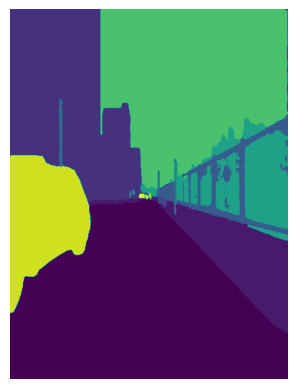

In [ ]:
plt.imshow(predicted_semantic_map.cpu())
plt.axis('off')
plt.show()

In [ ]:
unique_classes = np.unique(predicted_semantic_map.cpu())
print("Уникальные классы в predicted_semantic_map:", unique_classes)


Уникальные классы в predicted_semantic_map: [ 0  1  2  3  4  5  7  8 10 11 12 13 14]


Уникальные классы в predicted_semantic_map: [ 0  1  2  3  4  5  7  8 10 11 12 13 14]


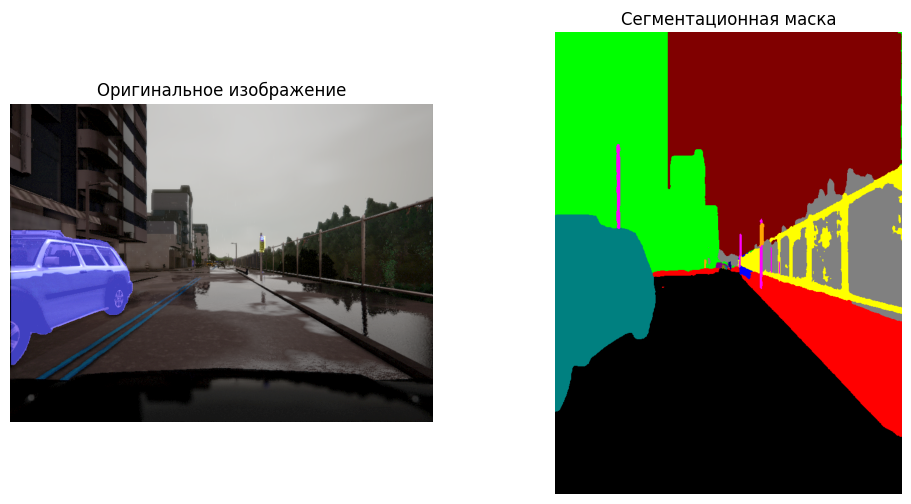

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

unique_classes = np.unique(predicted_semantic_map.cpu())
print("Уникальные классы в predicted_semantic_map:", unique_classes)

num_classes = 15
colors = np.array([
    [0, 0, 0],       # 0:
    [255, 0, 0],     # 1:
    [0, 255, 0],     # 2:
    [0, 0, 255],     # 3:
    [255, 255, 0],   # 4:
    [255, 0, 255],   # 5:
    [0, 255, 255],   # 6:
    [255, 165, 0],   # 7:
    [128, 128, 128], # 8:
    [0, 128, 0],     # 9:
    [128, 0, 0],     # 10:
    [128, 128, 0],   # 11:
    [0, 0, 128],     # 12:
    [0, 128, 128],   # 13:
    [128, 0, 128],   # 14:
])


colored_mask = colors[predicted_semantic_map.cpu()]


plt.figure(figsize=(12, 6))


plt.subplot(1, 2, 1)
plt.imshow(image)
plt.axis('off')
plt.title("Оригинальное изображение")


plt.subplot(1, 2, 2)
plt.imshow(colored_mask)
plt.axis('off')
plt.title("Сегментационная маска")

plt.show()


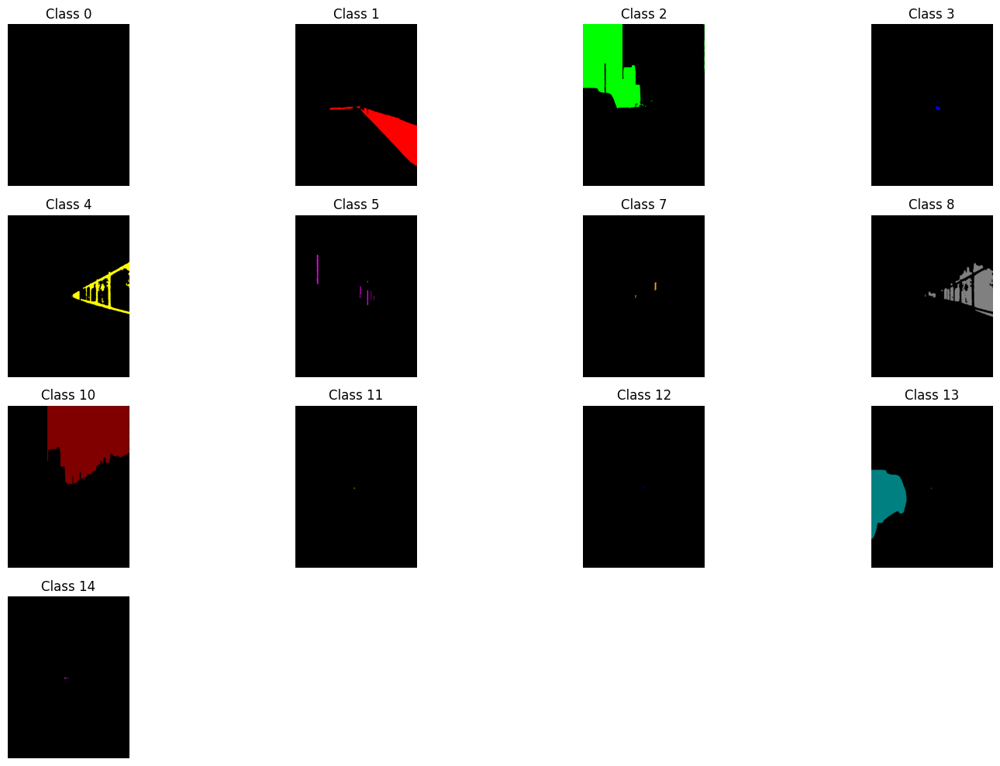

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


colors = np.array([
    [0, 0, 0],
    [255, 0, 0],
    [0, 255, 0],
    [0, 0, 255],
    [255, 255, 0],
    [255, 0, 255],
    [0, 255, 255],
    [255, 165, 0],
    [128, 128, 128],
    [0, 128, 0],
    [128, 0, 0],
    [128, 128, 0],
    [0, 0, 128],
    [0, 128, 128],
    [128, 0, 128]
])


plt.figure(figsize=(15, 10))

for i, class_id in enumerate(unique_classes):
    class_mask = (predicted_semantic_map.cpu().numpy() == class_id).astype(np.uint8) * 255

    colored_mask = np.zeros((*class_mask.shape, 3), dtype=np.uint8)
    if class_id < len(colors):
        colored_mask[class_mask == 255] = colors[class_id]

    plt.subplot(4, 4, i + 1)
    plt.imshow(colored_mask)
    plt.axis('off')
    plt.title(f'Class {class_id}')

plt.tight_layout()
plt.show()


In [ ]:
binary_mask_used = []
mask_used = [
              10, #unlabeled
              2, #building
              4, #fence
              1, #side walk
              8, #vegeterian
              13, #car
              6 #traffic sign
]

for class_id in mask_used:
    binary_mask = (predicted_semantic_map.cpu().numpy() == class_id).astype(np.uint8)
    binary_mask_used.append(binary_mask)



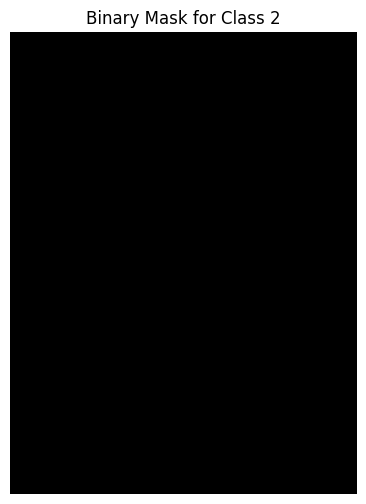

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 6))
plt.imshow(binary_mask, cmap='gray')
plt.axis('off')
plt.title('Binary Mask for Class 2')
plt.show()


[  0 255]


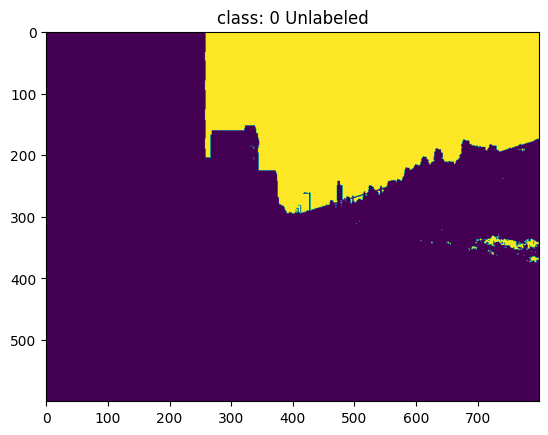

[  0 255]


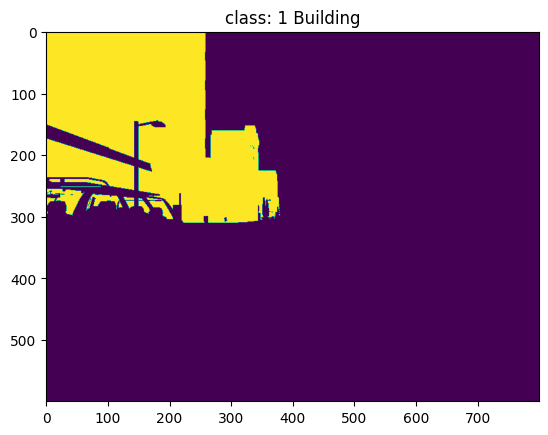

[  0 255]


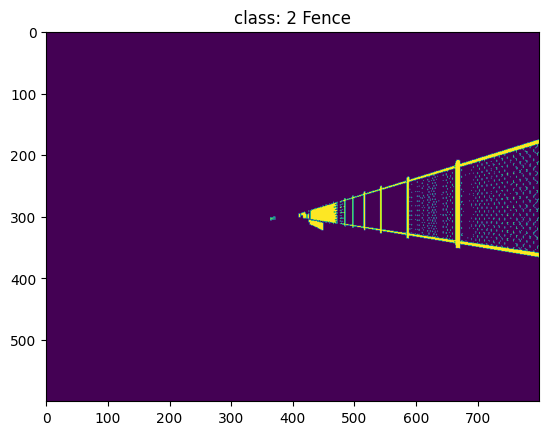

[  0 255]


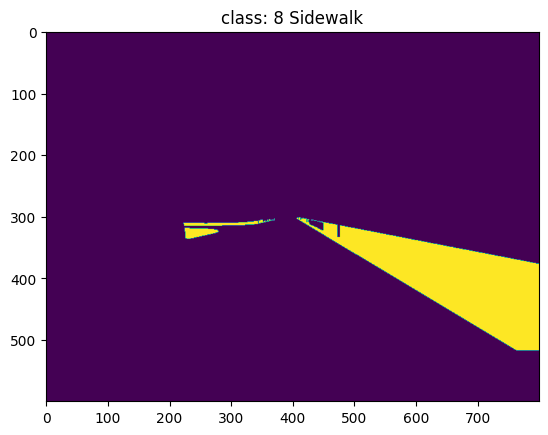

[  0 255]


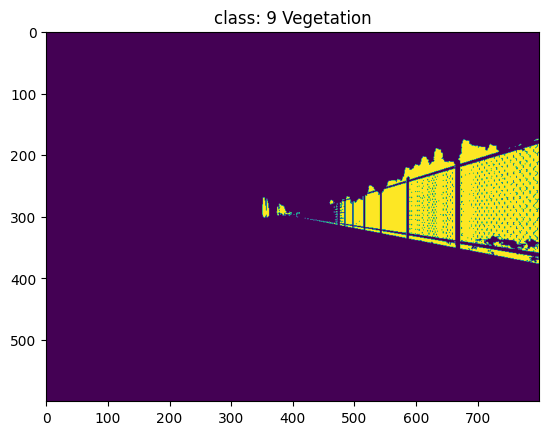

[  0 255]


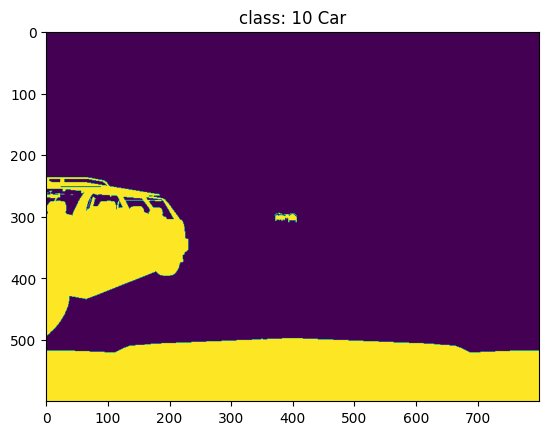

[  0 255]


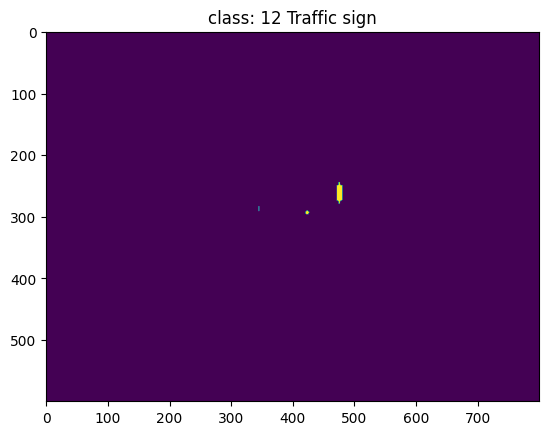

In [ ]:
img = '02_00_000'

masks_used = []
labels_used = [0, 1, 2, 8, 9, 10, 12]
for i in labels_used:
    #mask = plt.imread('./lyft_segmentation/segmentation_masks/{}.png'.format(img)) * 255
    mask = plt.imread('/content/lyft_segmentation/segmentation_masks/02_00_000.png') * 255
    mask = np.where(mask == i, 255, 0)
    mask = mask[:,:,0]
    print(np.unique(mask))
    plt.title(f'class: {i} {labels[i]}')
    plt.imshow(mask)
    plt.show()
    masks_used.append(mask)


In [ ]:
def calculate_metrics(gt_mask_tensor, pred_mask_tensor):
    gt_mask_tensor = gt_mask_tensor.squeeze(0).squeeze(0)
    pred_mask_tensor = pred_mask_tensor.squeeze(0).squeeze(0)

    intersection = (pred_mask_tensor & gt_mask_tensor).sum()  # Пересечение
    union = (pred_mask_tensor | gt_mask_tensor).sum()  # Объединение

    true_positives = ((pred_mask_tensor == 1) & (gt_mask_tensor == 1)).sum()
    false_negatives = ((pred_mask_tensor == 0) & (gt_mask_tensor == 1)).sum()
    false_positives = ((pred_mask_tensor == 1) & (gt_mask_tensor == 0)).sum()

    recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else torch.tensor(0.0)

    precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else torch.tensor(0.0)

    iou = intersection / union if union > 0 else torch.tensor(0.0)

    f1_score = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else torch.tensor(0.0)


    return {
        'IoU': iou.item(),
        'Recall': recall.item(),
        'Precision': precision.item(),
        'F1 Score': f1_score.item(),
    }


In [ ]:
# Список для хранения метрик для каждой маски
metrics_per_mask = []

# Генерация и подсчет метрик для каждой пары масок
for i in range(len(masks_used)):
    gt_mask_np = np.array(masks_used[i])
    gt_mask_binary = (gt_mask_np > 0).astype(np.uint8)
    gt_mask_tensor = torch.tensor(gt_mask_binary).unsqueeze(0).unsqueeze(0).to(device)

    binary_mask = binary_mask_used[i]
    pred_mask_tensor = torch.tensor(binary_mask, dtype=torch.uint8).unsqueeze(0).unsqueeze(0).to(device)
    if gt_mask_tensor.shape != pred_mask_tensor.shape:
        pred_mask_tensor = torch.nn.functional.interpolate(
            pred_mask_tensor.float(),
            size=gt_mask_tensor.shape[2:],
            mode='nearest'
        ).byte()

    metrics = calculate_metrics(gt_mask_tensor, pred_mask_tensor)
    metrics_per_mask.append(metrics)

for i, metrics in enumerate(metrics_per_mask):
    print(f'Metrics for mask {labels[labels_used[i]]}:')
    print(f'IoU: {metrics["IoU"]:.4f}, Recall: {metrics["Recall"]:.4f}, Precision: {metrics["Precision"]:.4f}, F1 Score: {metrics["F1 Score"]:.4f}')


Metrics for mask Unlabeled:
IoU: 0.9781, Recall: 0.9795, Precision: 0.9986, F1 Score: 0.9889
Metrics for mask Building:
IoU: 0.8984, Recall: 0.9514, Precision: 0.9416, F1 Score: 0.9465
Metrics for mask Fence:
IoU: 0.3889, Recall: 0.7330, Precision: 0.4531, F1 Score: 0.5600
Metrics for mask Sidewalk:
IoU: 0.9327, Recall: 0.9658, Precision: 0.9646, F1 Score: 0.9652
Metrics for mask Vegetation:
IoU: 0.7285, Recall: 0.7902, Precision: 0.9033, F1 Score: 0.8429
Metrics for mask Car:
IoU: 0.3006, Recall: 0.3131, Precision: 0.8826, F1 Score: 0.4622
Metrics for mask Traffic sign:
IoU: 0.0000, Recall: 0.0000, Precision: 0.0000, F1 Score: 0.0000


Oneformer показывает очень хорошие результаты даже без дообучения, тк предобучена на схожем датасете cityscapes, однако есть несколько причин, почему я выбрал не ее:

1) Даже сама предобученная моделька тяжело помещается на колаб

2) Эту версию невозможно зафайнтюнить из-за ограниченности ресурсов колаба, даже с батчем размером в 1 изображение он не проходит по лимитам гпу

-------------------------------------------------------------
# Segformer
-------------------------------------------------------------






### Преобразование масок сегментации из rgb формата в чб для finetuning-а segformer

In [17]:
import os
from PIL import Image
from tqdm import tqdm
import numpy as np

input_dir = "/content/lyft_segmentation/segmentation_masks"
output_dir = "/content/lyft_segmentation/segmentation_masks_processed"

os.makedirs(output_dir, exist_ok=True)

mask_files = [f for f in os.listdir(input_dir) if f.endswith(".png")]

for filename in tqdm(mask_files, desc="Processing masks", unit="mask"):
    mask_path = os.path.join(input_dir, filename)
    mask_image = np.array(Image.open(mask_path))
    mask_image = mask_image[:, :, 0]
    mask_image = Image.fromarray(mask_image.astype(np.uint8))
    output_path = os.path.join(output_dir, filename)
    mask_image.save(output_path)

print("Все маски успешно преобразованы и сохранены.")


Processing masks: 100%|██████████| 5000/5000 [01:38<00:00, 51.02mask/s]

Все маски успешно преобразованы и сохранены.


### Создадим из наших изобрежений и масок датасет, однако из-за огранниченности ресурсов озу в colab получается обработать только 90%, после чего он перезагружается, поэтому удалим часть изображений и масок

In [18]:
import os
import random
from tqdm import tqdm

image_dir = "/content/lyft_segmentation/images"
mask_dir = "/content/lyft_segmentation/segmentation_masks_processed"

image_files = sorted(os.listdir(image_dir))
mask_files = sorted(os.listdir(mask_dir))

num_files_to_remove = int(0.95 * len(image_files))

files_to_remove = random.sample(range(len(image_files)), num_files_to_remove)

for idx in tqdm(files_to_remove, desc="Удаление файлов"):
    image_file = image_files[idx]
    mask_file = mask_files[idx]

    image_path = os.path.join(image_dir, image_file)
    mask_path = os.path.join(mask_dir, mask_file)

    os.remove(image_path)
    os.remove(mask_path)

print(f"Удалено {num_files_to_remove} изображений и масок.")


Удаление файлов: 100%|██████████| 4750/4750 [00:00<00:00, 5705.16it/s]

Удалено 4750 изображений и масок.


In [19]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 32.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 18.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 18.7 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [20]:
from datasets import Dataset, DatasetDict
from PIL import Image
import numpy as np
import os
from tqdm import tqdm

image_dir = "/content/lyft_segmentation/images"
mask_dir = "/content/lyft_segmentation/segmentation_masks_processed"

image_files = sorted(os.listdir(image_dir))
mask_files = sorted(os.listdir(mask_dir))

def load_image_and_mask(image_file, mask_file):
    image_path = os.path.join(image_dir, image_file)
    mask_path = os.path.join(mask_dir, mask_file)

    image = Image.open(image_path).convert("RGB")
    mask = Image.open(mask_path)
    mask = np.array(mask)

    return {"image": image, "mask": mask}

data = []
for image_file, mask_file in tqdm(zip(image_files, mask_files), total=len(image_files), desc="Загрузка данных"):
    data.append(load_image_and_mask(image_file, mask_file))

images = [d["image"] for d in tqdm(data, desc="Подготовка изображений для датасета")]
masks = [d["mask"] for d in tqdm(data, desc="Подготовка масок для датасета")]

dataset = Dataset.from_dict({"pixel_values": images, "labels": masks})
dataset = dataset.train_test_split(test_size=0.2, seed=42)
train_ds = dataset["train"]
test_ds = dataset["test"]

print(train_ds[0])


Подготовка масок для датасета: 100%|██████████| 250/250 [00:00<00:00, 853194.47it/s]


{'pixel_values': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=800x600 at 0x7842566757B0>, 'labels': [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [21]:
for i in range(1, 6):
    labels = train_ds[i]['labels']

    # Убедимся, что labels — это NumPy массив
    if isinstance(labels, torch.Tensor):
        labels = labels.numpy()  # Преобразуем тензор в NumPy массив, если это PyTorch тензор

    unique_values = np.unique(labels)

    print(f"Элемент {i}:")
    print(train_ds[i])
    print("--" * 100)
    print("Уникальные значения меток:", unique_values)


Элемент 1:
{'pixel_values': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=800x600 at 0x7843308671C0>, 'labels': [[9, 0, 9, 9, 9, 9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [24]:
# Словарь id2label
id2label = {
    0: "Unlabeled",
    1: "Building",
    2: "Fence",
    3: "Other",
    4: "Pedestrian",
    5: "Pole",
    6: "Roadline",
    7: "Road",
    8: "Sidewalk",
    9: "Vegetation",
    10: "Car",
    11: "Wall",
    12: "Traffic sign"
}

# Словарь label2id (обратный)
label2id = {v: k for k, v in id2label.items()}

import json

# Сохраняем id2label
with open("id2label.json", "w") as f:
    json.dump(id2label, f)

# Сохраняем label2id
with open("label2id.json", "w") as f:
    json.dump(label2id, f)

print("id2label:", id2label)
print("label2id:", label2id)


id2label: {0: 'Unlabeled', 1: 'Building', 2: 'Fence', 3: 'Other', 4: 'Pedestrian', 5: 'Pole', 6: 'Roadline', 7: 'Road', 8: 'Sidewalk', 9: 'Vegetation', 10: 'Car', 11: 'Wall', 12: 'Traffic sign'}
label2id: {'Unlabeled': 0, 'Building': 1, 'Fence': 2, 'Other': 3, 'Pedestrian': 4, 'Pole': 5, 'Roadline': 6, 'Road': 7, 'Sidewalk': 8, 'Vegetation': 9, 'Car': 10, 'Wall': 11, 'Traffic sign': 12}


In [22]:
from torchvision.transforms import ColorJitter
from transformers import (
    SegformerImageProcessor,
)

processor = SegformerImageProcessor()


def train_transforms(example_batch):
    # Извлекаем изображения и маски
    images = [pixel_values for pixel_values in example_batch['pixel_values']]
    labels = [torch.tensor(label).long() for label in example_batch['labels']]

    # Применяем преобразования
    inputs = processor(images=images, segmentation_maps=labels, return_tensors="pt")

    return inputs


def val_transforms(example_batch):
    images = [pixel_values for pixel_values in example_batch['pixel_values']]
    labels = [torch.tensor(label).long() for label in example_batch['labels']]
    inputs = processor(images=images, segmentation_maps=labels, return_tensors="pt")

    return inputs


# Set transforms
train_ds.set_transform(train_transforms)
test_ds.set_transform(val_transforms)

In [25]:
from transformers import SegformerForSemanticSegmentation
pretrained_model_name = "nvidia/segformer-b5-finetuned-cityscapes-1024-1024"

model = SegformerForSemanticSegmentation.from_pretrained(
    pretrained_model_name,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True
)
model.to(device)
print()

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/339M [00:00<?, ?B/s]

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-cityscapes-1024-1024 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([19, 768, 1, 1]) in the checkpoint and torch.Size([13, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([19]) in the checkpoint and torch.Size([13]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [26]:
!pip install evaluate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 8.3 MB/s eta 0:00:00


In [27]:
from transformers import TrainingArguments

epochs = 50
lr = 0.00006
batch_size = 4

training_args = TrainingArguments(
    output_dir="./results",  # Папка для сохранения результатов (моделей, логов)
    learning_rate=lr,  # Устанавливаем скорость обучения
    num_train_epochs=epochs,  # Число эпох
    per_device_train_batch_size=batch_size,  # Размер батча для тренировки
    per_device_eval_batch_size=batch_size,  # Размер батча для валидации
    save_total_limit=6,  # Ограничение на количество сохраненных моделей
    evaluation_strategy="steps",  # Оценка на каждом шаге
    save_strategy="steps",  # Сохранение на каждом шаге
    save_steps=100,  # Сохраняем модель каждые 20 шагов
    eval_steps=20,  # Оценка на каждом шаге
    logging_steps=1,  # Логируем информацию на каждом шаге
    eval_accumulation_steps=5,  # Суммируем градиенты для нескольких шагов
    load_best_model_at_end=True,  # Загружаем лучшую модель в конце
    remove_unused_columns=False,  # Оставляем все колонки (важно для кастомных данных)
    report_to="none",  # Отключаем отчетность в wandb
    run_name="segformer_experiment",  # Имя для конкретного запуска
    gradient_accumulation_steps=2,  # Умножаем количество шагов для аккумуляции
)

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1568: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


In [28]:
import torch
from torch import nn
import evaluate
from transformers import SegformerImageProcessor

metric = evaluate.load("mean_iou")

def compute_metrics(eval_pred):
    with torch.no_grad():
        logits, labels = eval_pred
        logits_tensor = torch.from_numpy(logits)

        logits_tensor = nn.functional.interpolate(
            logits_tensor,
            size=labels.shape[-2:],
            mode="bilinear",
            align_corners=False,
        ).argmax(dim=1)

        pred_labels = logits_tensor.detach().cpu().numpy()

        metrics = metric._compute(
            predictions=pred_labels,
            references=labels,
            num_labels=len(id2label),
            ignore_index=0,
            reduce_labels=processor.do_reduce_labels,
        )

        per_category_accuracy = metrics.pop("per_category_accuracy").tolist()
        per_category_iou = metrics.pop("per_category_iou").tolist()

        metrics.update({f"accuracy_{id2label[i]}": v for i, v in enumerate(per_category_accuracy)})
        metrics.update({f"iou_{id2label[i]}": v for i, v in enumerate(per_category_iou)})

        return metrics


In [29]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_ds,
    eval_dataset=test_ds,
    compute_metrics=compute_metrics,
)

In [ ]:
trainer.train()

In [ ]:
import json
import os

def find_best_checkpoint(results_dir="./results"):
    best_checkpoint = None
    best_eval_loss = float("inf")  # Чем меньше, тем лучше для loss

    # Перебираем чекпоинты в директории
    for checkpoint in os.listdir(results_dir):
        checkpoint_dir = os.path.join(results_dir, checkpoint)
        trainer_state_path = os.path.join(checkpoint_dir, "trainer_state.json")

        if os.path.exists(trainer_state_path):
            with open(trainer_state_path) as f:
                trainer_state = json.load(f)
                eval_loss = trainer_state.get("best_metric", None)

                if eval_loss is not None and eval_loss < best_eval_loss:
                    best_eval_loss = eval_loss
                    best_checkpoint = checkpoint_dir

    return best_checkpoint

# Найти лучший чекпоинт
best_checkpoint_dir = find_best_checkpoint()
print(f"Лучший чекпоинт: {best_checkpoint_dir}")


После дообучения не сохраяняется процессор, поэтому сохраняем тот, который использовался до дообучения

In [ ]:
from transformers import SegformerImageProcessor

# Создаем процессор на основе предобученной модели, от которой вы начинали дообучение
processor = SegformerImageProcessor.from_pretrained("nvidia/segformer-b5-finetuned-cityscapes-1024-1024")

# Сохраняем процессор в папку чекпоинта
processor.save_pretrained(best_checkpoint_dir)


In [ ]:
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor

# Загрузка процессора и модели из директории чекпоинта
processor = SegformerImageProcessor.from_pretrained(best_checkpoint_dir)
model = SegformerForSemanticSegmentation.from_pretrained(best_checkpoint_dir)


In [ ]:
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation
from PIL import Image
import torch
import matplotlib.pyplot as plt

# Шаг 1: Инициализация процессора и загрузка обученной модели
#best_checkpoint_dir = "/content/results/checkpoint-240"  # Укажите путь к лучшему чекпоинту
processor = SegformerImageProcessor.from_pretrained(best_checkpoint_dir)
model = SegformerForSemanticSegmentation.from_pretrained(best_checkpoint_dir)

# Шаг 2: Загрузка изображения
image_path = "/content/02_00_000.png"  # Укажите путь к изображению
image = Image.open(image_path).convert("RGB")  # Загрузка и преобразование в RGB, если необходимо

# Шаг 3: Предобработка изображения
inputs = processor(images=image, return_tensors="pt")

# Шаг 4: Прогон через модель для получения предсказания
with torch.no_grad():
    outputs = model(**inputs)
    logits = outputs.logits  # Получаем логиты (перед softmax/sigmoid)
    predicted_mask = torch.argmax(logits, dim=1).squeeze().cpu().numpy()  # Находим метку класса для каждого пикселя

# Шаг 5: Отображение результата
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Оригинальное изображение")

plt.subplot(1, 2, 2)
plt.imshow(predicted_mask, cmap="jet")  # Отображение маски в цветовой карте
plt.title("Предсказанная маска")
plt.show()


In [ ]:
# Используем np.unique() для получения уникальных значений
unique_values = np.unique(predicted_mask)

print(unique_values)
print(len(unique_values))
print(len(predicted_mask))

In [ ]:
from PIL import Image
import numpy as np
import torch
from sklearn.metrics import precision_score, recall_score, f1_score, jaccard_score
import matplotlib.pyplot as plt

# Пути к файлам
true_mask_path = "/content/lyft_segmentation/segmentation_masks_processed/02_00_002.png"  # Путь к истинной маске
image_path = "/content/lyft_segmentation/images/02_00_002.png"  # Путь к исходному изображению

# Загрузка и подготовка изображения
original_image = Image.open(image_path).convert("RGB")
original_height, original_width = original_image.size  # Исходный размер изображения

# Загрузка истинной маски
true_mask = np.array(Image.open(true_mask_path).resize((original_width, original_height), resample=Image.NEAREST))

# Маска, предсказанная моделью SegFormer (в формате 256x256)
predicted_mask_256x256 = torch.argmax(logits, dim=1).squeeze().cpu().numpy()

# Преобразование предсказанной маски в PIL изображение и масштабирование до исходного размера
predicted_mask_img = Image.fromarray(predicted_mask_256x256.astype(np.uint8))
predicted_mask_resized = predicted_mask_img.resize((original_width, original_height), resample=Image.NEAREST)
predicted_mask_resized = np.array(predicted_mask_resized)

# Расчет метрик для каждого класса
unique_classes = np.unique(true_mask)

# Инициализация списков для метрик по каждому классу
precision_per_class = []
recall_per_class = []
f1_per_class = []
iou_per_class = []

for cls in unique_classes:
    # Создаем бинарные маски для текущего класса
    true_binary_mask = (true_mask == cls).flatten()
    pred_binary_mask = (predicted_mask_resized == cls).flatten()

    # Вычисляем метрики для текущего класса
    precision = precision_score(true_binary_mask, pred_binary_mask, zero_division=0)
    recall = recall_score(true_binary_mask, pred_binary_mask, zero_division=0)
    f1 = f1_score(true_binary_mask, pred_binary_mask, zero_division=0)
    iou = jaccard_score(true_binary_mask, pred_binary_mask, zero_division=0)

    # Сохраняем метрики
    precision_per_class.append(precision)
    recall_per_class.append(recall)
    f1_per_class.append(f1)
    iou_per_class.append(iou)

    # Выводим метрики для текущего класса
    class_name = id2label.get(cls)
    print(f"Класс {class_name}:")
    print(f"  Precision: {precision:.4f}")
    print(f"  Recall: {recall:.4f}")
    print(f"  F1-score: {f1:.4f}")
    print(f"  IoU: {iou:.4f}")

# Выводим средние метрики
print("\nСредние метрики:")
print(f"Mean Precision: {np.mean(precision_per_class):.4f}")
print(f"Mean Recall: {np.mean(recall_per_class):.4f}")
print(f"Mean F1-score: {np.mean(f1_per_class):.4f}")
print(f"Mean IoU: {np.mean(iou_per_class):.4f}")

# Отображение изображений и масок
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))
ax1.imshow(original_image)
ax1.set_title("Оригинальное изображение")
ax1.axis("off")

ax2.imshow(true_mask, cmap="jet")
ax2.set_title("Истинная маска")
ax2.axis("off")

ax3.imshow(predicted_mask_resized, cmap="jet")
ax3.set_title("Предсказанная маска")
ax3.axis("off")

plt.show()

Обучение модели можно увидеть в другом ноутбуке (segformer), здесь прикреплю вывод из программы для понимания и визуализации

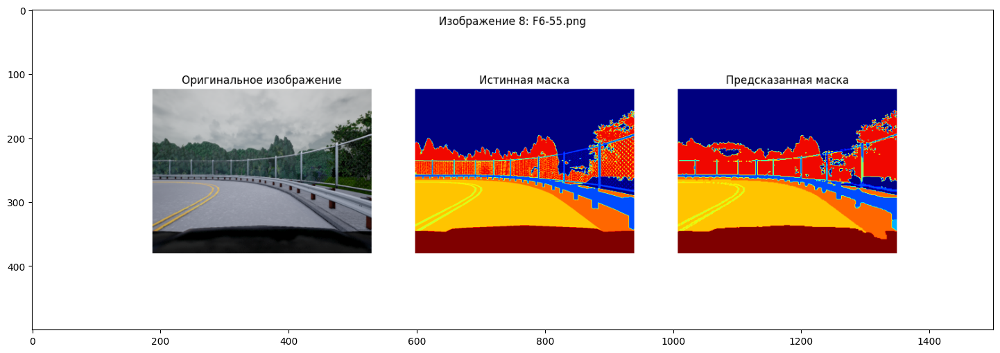

In [31]:
res_path = '/content/Figure_1.png'
image = Image.open(res_path)
plt.figure(figsize=(18, 6))
plt.imshow(image)

Результаты для изображения F6-55.png:

Класс Unlabeled: Precision: 0.9840, Recall: 0.9276, F1-score: 0.9549, IoU: 0.9138

Класс Fence: Precision: 0.8967, Recall: 0.7127, F1-score: 0.7941, IoU: 0.6586

Класс Roadline: Precision: 0.8260, Recall: 0.7911, F1-score: 0.8082, IoU: 0.6781

Класс Road: Precision: 0.9816, Recall: 0.9887, F1-score: 0.9851, IoU: 0.9707

Класс Sidewalk: Precision: 0.8705, Recall: 0.9663, F1-score: 0.9159, IoU: 0.8448

Класс Vegetation: Precision: 0.8067, Recall: 0.9541, F1-score: 0.8742, IoU: 0.7765

Класс Car: Precision: 0.9980, Recall: 0.9753, F1-score: 0.9865, IoU: 0.9733